# NMF on normalized transitions

So far the factorization has been performed on a non normalized subsection of the transition matrices. However in this section we will take a look at the result of row normalizing the data.

In [1]:
from sklearn.feature_extraction.text import CountVectorizer
from spmf import Spmf
import numpy as np
import pandas as pd
import os
import re
import matplotlib.pyplot as plt
import ast
pd.options.plotting.backend = "plotly"
import plotly.express as px
# from chart_studio import plotly
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.subplots as sp
pd.options.display.max_colwidth = None
pd.set_option('display.max_rows', 70)
from pandas.plotting import table 
import nltk
import seaborn as sns
%matplotlib inline
import random
import matplotlib.gridspec as grid
import matplotlib
from sklearn.decomposition import NMF

In [2]:
commoparable_transitions=pd.read_csv("comparable_transitions_1000_most_common.csv")
commoparable_transitions=commoparable_transitions.set_index(['package_name','next_app'])
commoparable_transitions.columns=commoparable_transitions.columns.astype(int)

In [3]:
data=pd.read_csv("names_with_app_clusters.csv",usecols=['user_id','package_name','session'])
data['next_app']=data.groupby(['user_id','session']).package_name.shift(-1)
data=data.set_index('user_id')

## Row normalization
We start by performing row normalization, to compensate for the populairity of the apps.

In [4]:
row_normailized=commoparable_transitions[set(commoparable_transitions.columns)-set(['transition'])].sub(commoparable_transitions[set(commoparable_transitions.columns)-set(['transition'])].min(axis=1),axis=0).div(commoparable_transitions[set(commoparable_transitions.columns)-set(['transition'])].max(axis=1)-commoparable_transitions[set(commoparable_transitions.columns)-set(['transition'])].min(axis=1),axis=0)

In [5]:
X=row_normailized

model = NMF(n_components=7, init='random', random_state=0)
W = model.fit_transform(X)
H = model.components_

W=pd.DataFrame(W)
H=pd.DataFrame(H)

W['transition']=['{} -> {}'.format(i[0], i[1]) for i in commoparable_transitions.index[W.index]]
W['next_app']=commoparable_transitions.reset_index()['next_app']

W=W.sort_values(['next_app','transition'])
W=W.drop(columns=['next_app'])
W=W.rename(columns={0:'Factor 1',1:'Factor 2',2:'Factor 3',3:'Factor 4',4:'Factor 5',5:'Factor 6',6:'Factor 7'})

We check the relationship between the seven factors in the plot below. Some linearity can be observed beween Factor 1 and 2, however the there are some extrem transition captured by factor 1. The remaining factors appear to be well spread out, and the seven factors are therefore deemed acceptable.

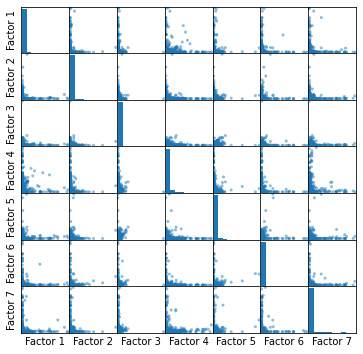

In [74]:
plt.setp(pd.plotting.scatter_matrix(W,figsize=(6,6)),xticks=[], yticks=[])
plt.savefig("NMF_row_norm_corr_7factors.pdf", 
               bbox_inches='tight', 
               transparent=True,
               pad_inches=0)
plt.show()

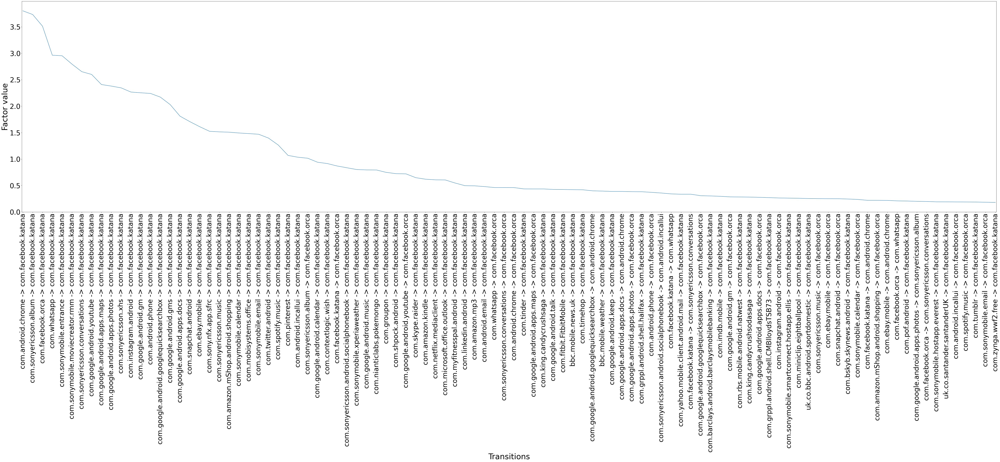

In [12]:
plt.figure(figsize=(90, 20), dpi=80)
W_f1=W[W['Factor 1'].isin(W['Factor 1'].nlargest(100))]
W_f1=W_f1.sort_values('Factor 1',ascending=False)
plt.plot(W_f1['transition'],W_f1['Factor 1'],label='Factor 1')
plt.xticks(fontsize=35, rotation=90)
plt.yticks(fontsize=35)
plt.margins(x=0.001)
plt.xlabel('Transitions',fontsize=40)
plt.ylabel('Factor value',fontsize=40)
plt.savefig("factor1_row_norm_top100.pdf", 
               bbox_inches='tight', 
               transparent=True,
               pad_inches=0)
plt.show()

Captur similar behaviour as the Facebook component found with NMF on the matrix before normalization, even through there is some differences in the order of which app the transition start for, for the highest factor values

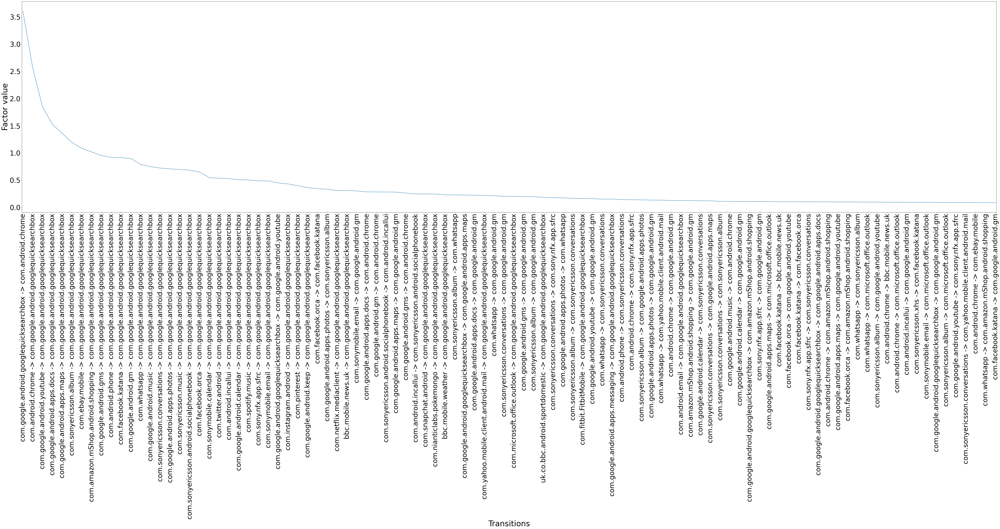

In [13]:
plt.figure(figsize=(90, 20), dpi=80)
W_f2=W[W['Factor 2'].isin(W['Factor 2'].nlargest(100))]
W_f2=W_f2.sort_values('Factor 2',ascending=False)
plt.plot(W_f2['transition'],W_f2['Factor 2'],label='Factor 2')
plt.xticks(fontsize=35, rotation=90)
plt.yticks(fontsize=35) 
plt.margins(x=0.001)
plt.xlabel('Transitions',fontsize=40)
plt.ylabel('Factor value',fontsize=40)
plt.savefig("factor2_row_norm_100.pdf", 
               bbox_inches='tight', 
               transparent=True,
               pad_inches=0)
plt.show()

Similar behaviour as captured by the Google component.

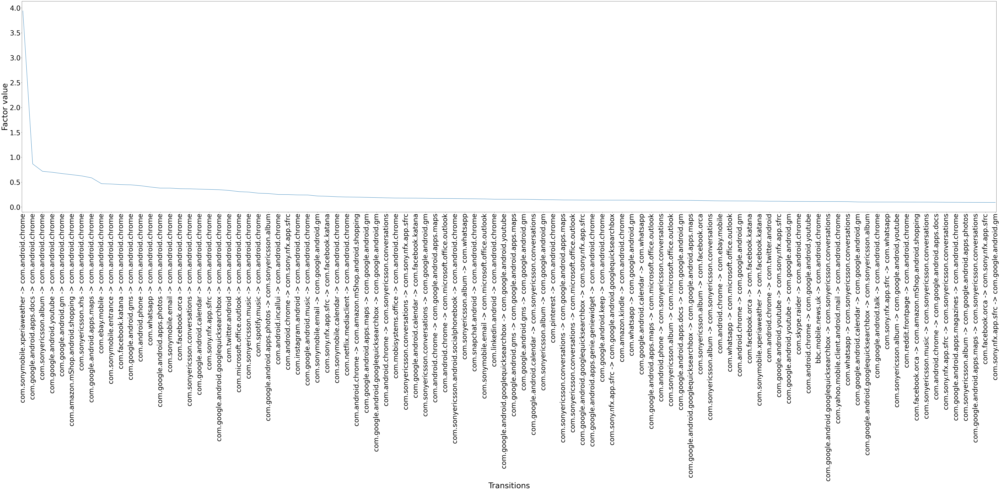

In [14]:
plt.figure(figsize=(90, 20), dpi=80)
W_f3=W[W['Factor 3'].isin(W['Factor 3'].nlargest(100))]
W_f3=W_f3.sort_values('Factor 3',ascending=False)
plt.plot(W_f3['transition'],W_f3['Factor 3'],label='Factor 3')
plt.xticks(fontsize=35, rotation=90)
plt.yticks(fontsize=35)
plt.margins(x=0.001)
plt.xlabel('Transitions',fontsize=40)
plt.ylabel('Factor value',fontsize=40)
plt.savefig("factor3_row_norm_100.pdf", 
               bbox_inches='tight', 
               transparent=True,
               pad_inches=0)
plt.show()

Capture similar behaviour as the weather component, but with a bit o the chrome component.

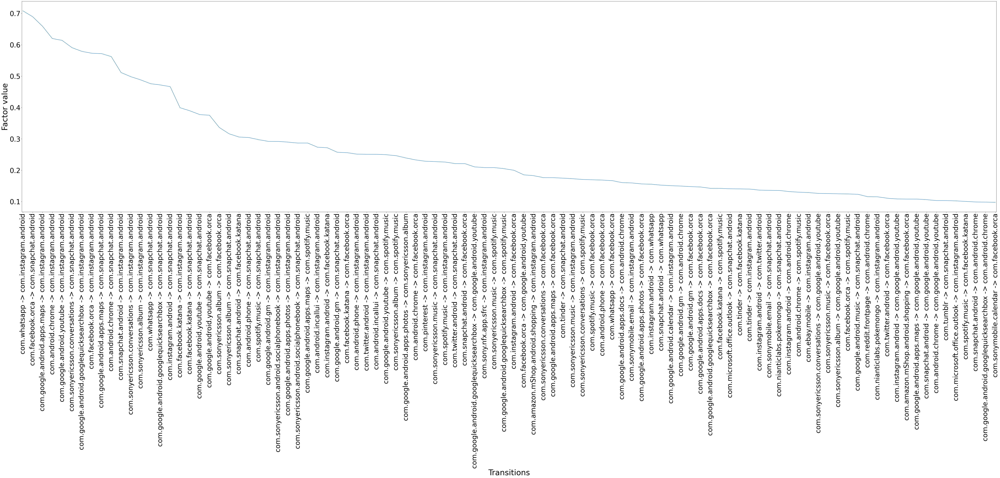

In [19]:
plt.figure(figsize=(90, 20), dpi=80)
W_f4=W[W['Factor 4'].isin(W['Factor 4'].nlargest(100))]
W_f4=W_f4.sort_values('Factor 4',ascending=False)
plt.plot(W_f4['transition'],W_f4['Factor 4'],label='Factor 4')
plt.xticks(fontsize=35, rotation=90)
plt.yticks(fontsize=35)
plt.margins(x=0.001)
plt.xlabel('Transitions',fontsize=40)
plt.ylabel('Factor value',fontsize=40)
plt.savefig("factor4_row_norm_100.pdf", 
               bbox_inches='tight', 
               transparent=True,
               pad_inches=0)
plt.show()

While there is some differences in the apps from which the transitions start, for the highest factor values, it primarly capture transitions to instagram and snapchat, as the social media - multimedia component also does.

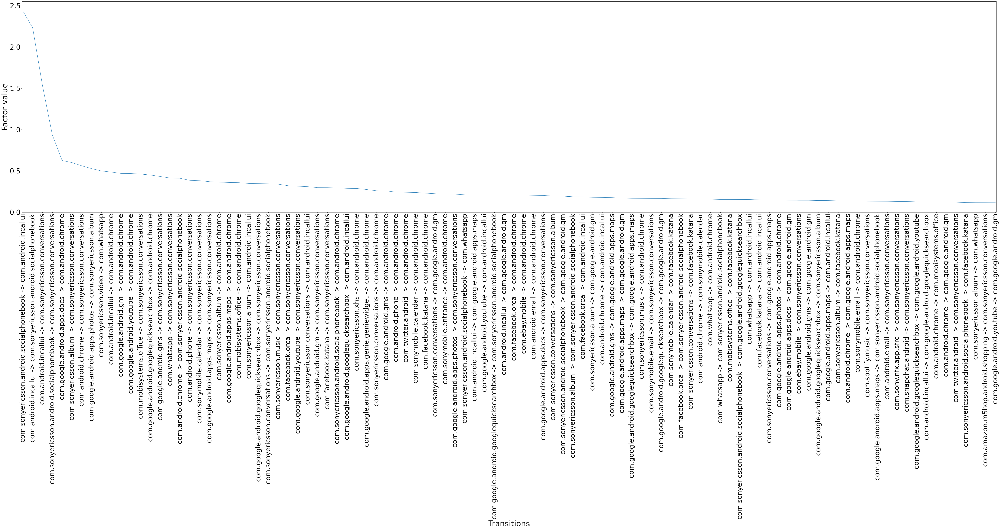

In [20]:
plt.figure(figsize=(90, 20), dpi=80)
W_f5=W[W['Factor 5'].isin(W['Factor 5'].nlargest(100))]
W_f5=W_f5.sort_values('Factor 5',ascending=False)
plt.plot(W_f5['transition'],W_f5['Factor 5'],label='Factor 5')
plt.xticks(fontsize=35, rotation=90)
plt.yticks(fontsize=35)
plt.margins(x=0.001)
plt.xlabel('Transitions',fontsize=40)
plt.ylabel('Factor value',fontsize=40)
plt.savefig("factor5_row_norm_100.pdf", 
               bbox_inches='tight', 
               transparent=True,
               pad_inches=0)
plt.show()

Very similar to the results from the Traditional communication component.

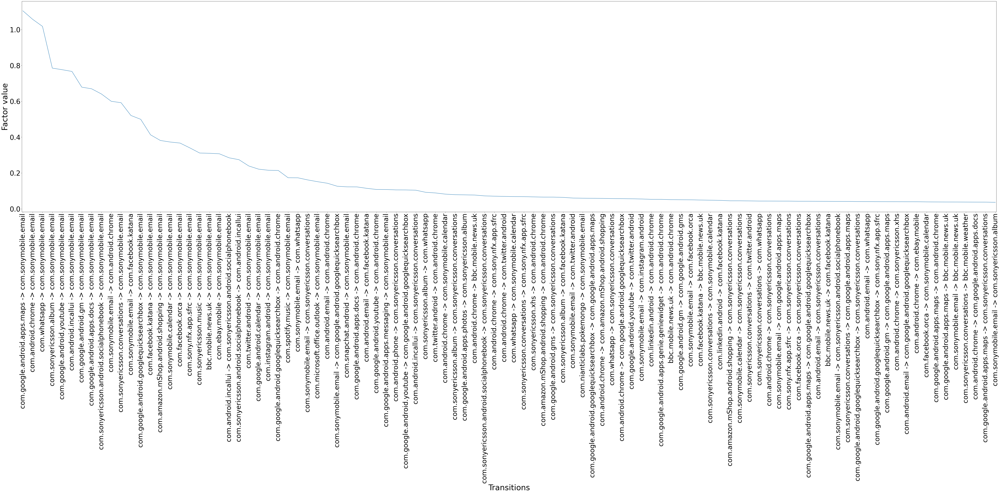

In [21]:
plt.figure(figsize=(90, 20), dpi=80)
W_f6=W[W['Factor 6'].isin(W['Factor 6'].nlargest(100))]
W_f6=W_f6.sort_values('Factor 6',ascending=False)
plt.plot(W_f6['transition'],W_f6['Factor 6'],label='Factor 6')
plt.xticks(fontsize=35, rotation=90)
plt.yticks(fontsize=35)
plt.margins(x=0.001)
plt.xlabel('Transitions',fontsize=40)
plt.ylabel('Factor value',fontsize=40)
plt.savefig("factor6_row_norm_100.pdf", 
               bbox_inches='tight', 
               transparent=True,
               pad_inches=0)
plt.show()

Does not capturre behaviour similar to any of the previous component, but in stead appear to have a main focus on transitions to the Sony Email app.

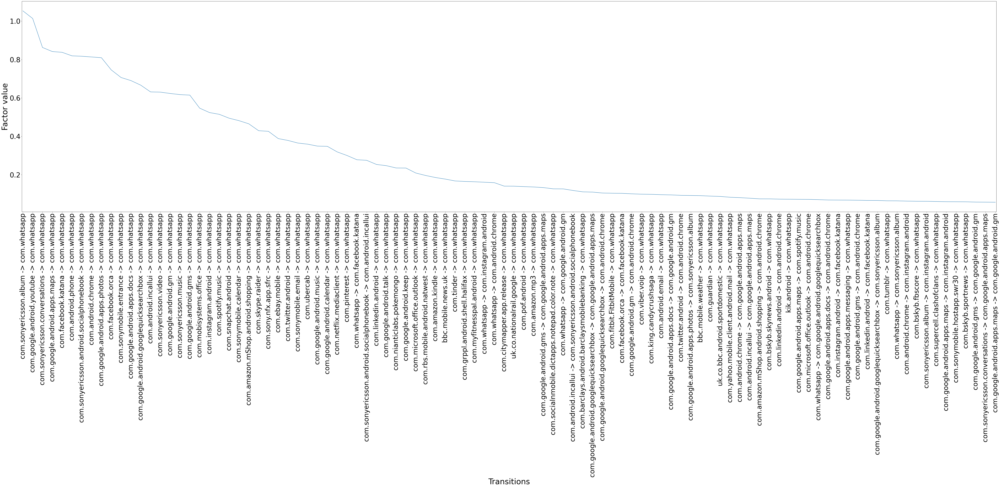

In [22]:
plt.figure(figsize=(90, 20), dpi=80)
W_f7=W[W['Factor 7'].isin(W['Factor 7'].nlargest(100))]
W_f7=W_f7.sort_values('Factor 7',ascending=False)
plt.plot(W_f7['transition'],W_f7['Factor 7'],label='Factor 7')
plt.xticks(fontsize=35, rotation=90)
plt.yticks(fontsize=35)
plt.margins(x=0.001)
plt.xlabel('Transitions',fontsize=40)
plt.ylabel('Factor value',fontsize=40)
plt.savefig("factor7_row_norm_100.pdf", 
               bbox_inches='tight', 
               transparent=True,
               pad_inches=0)
plt.show()

Similar behaviour as the whatsapp component.


### User loadings
We now take a look at how the different users behave based on their loadings of the components.

In [24]:
test=H.transpose()

In [29]:
test[5].to_csv("factor_R_loadings.csv",index=True)

In [30]:
test=H.transpose()
test['max_factor']=H.idxmax()
test=test.sort_values('max_factor')

group=test.groupby('max_factor')
groups=[]
for i in range(7):
    group_i=group.get_group(i)
    group_i["2_highest"]=group_i.drop(columns=[i,'max_factor']).idxmax(axis=1)
    groups.append(group_i)
test=pd.concat(groups)
group=test.groupby(['max_factor','2_highest'])
groups=[]
for i,j in group:
    group_i=j
    group_i["3_highest"]=group_i.drop(columns=[i[0],i[1],'max_factor','2_highest']).idxmax(axis=1)
    groups.append(group_i)
test=pd.concat(groups)
group=test.groupby(['max_factor','2_highest',"3_highest"])
groups=[]
for i,j in group:
    group_i=j
    group_i["4_highest"]=group_i.drop(columns=[i[0],i[1],i[2],"3_highest",'max_factor','2_highest']).idxmax(axis=1)
    groups.append(group_i)
test=pd.concat(groups)
group=test.groupby(['max_factor','2_highest',"3_highest","4_highest"])
groups=[]
for i,j in group:
    group_i=j
    group_i["5_highest"]=group_i.drop(columns=[i[0],i[1],i[2],i[3],"4_highest","3_highest",'max_factor','2_highest']).idxmax(axis=1)
    groups.append(group_i)
test=pd.concat(groups)
group=test.groupby(['max_factor','2_highest',"3_highest","4_highest","5_highest"])
groups=[]
for i,j in group:
    group_i=j
    group_i["6_highest"]=group_i.drop(columns=[i[0],i[1],i[2],i[3],i[4],"5_highest","4_highest","3_highest",'max_factor','2_highest']).idxmax(axis=1)
    groups.append(group_i)
test=pd.concat(groups)

test.reset_index(inplace=True)

<ipython-input-30-34342836592f>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group_i["2_highest"]=group_i.drop(columns=[i,'max_factor']).idxmax(axis=1)


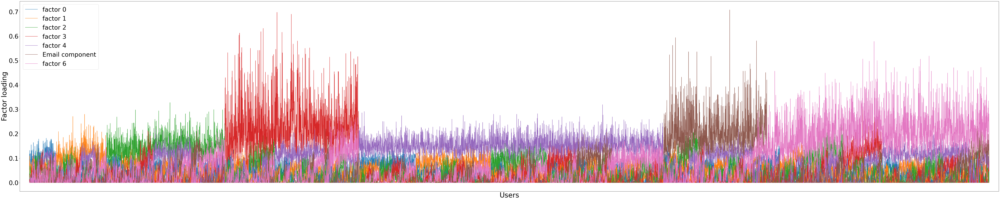

In [33]:
plt.figure(figsize=(100, 20), dpi=80)
plt.plot(test.index,test[0],label='factor 0')
plt.plot(test.index,test[1],label='factor 1')
plt.plot(test.index,test[2],label='factor 2')
plt.plot(test.index,test[3],label='factor 3')
plt.plot(test.index,test[4],label='factor 4')
plt.plot(test.index,test[5],label='Email component')
plt.plot(test.index,test[6],label='factor 6')
plt.yticks(fontsize=35)
plt.legend(fontsize=35) 
plt.margins(x=0.01)
plt.xlabel('Users',fontsize=40)
plt.xticks([])  
plt.ylabel('Factor loading',fontsize=40)
plt.show()

The 500 users with the highest loading of factor 5 (The email component) are exported.

In [37]:
test=test.rename(columns={'index':'user_id'})
top_500_factor_5_loadings=test.nlargest(500,5).user_id

In [38]:
top_500_factor_6_loadings.to_csv("top500_users_email_component.csv")

NameError: name 'top_500_factor_6_loadings' is not defined